In [ ]:
!pip install plyfile

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import cv2
from PIL import Image
import numpy as np
#import plyfile

def create_3D_model(color_image, depth_map, camera_matrix, distortion_coefficients, filename):
    """
    Creates a 3D model from a RGB color image and a depth map using OpenCV.
    :param color_image: RGB color image as a numpy array (height x width x 3)
    :param depth_image: Depth map as a numpy array (height x width)
    :param camera_matrix: Camera intrinsic matrix (3x3)
    :param dist_coeffs: Camera distortion coefficients (1x5 or 1x8)
    :return: 3D point cloud as a numpy array (n x 3)
    """
    # Convert depth map to 16-bit float
    depth_image = depth_image.astype(np.float32)

    # Convert color image to grayscale
    gray = cv2.cvtColor(texture_map, cv2.COLOR_BGR2GRAY)

    # Get 3D coordinates of each pixel
    points = cv2.reprojectImageTo3D(depth_image, camera_matrix, distortion_coefficients)

    # Remove invalid 3D points (where depth == 0)
    mask = depth_image > 0
    points = points[mask]
    
     #Enregistrement des données du modèle 3D dans un fichier .ply
    vertex = np.array([points_3d], dtype=[('x', 'f4'), ('y', 'f4'), ('z', 'f4')])
    color = np.array([colors], dtype=[('red', 'u1'), ('green', 'u1'), ('blue', 'u1')])
    face = np.array([triangles], dtype=[('vertex_indices', 'i4', (3,))])

    ply_data = plyfile.PlyData([plyfile.PlyElement.describe(vertex, 'vertex'),
                                plyfile.PlyElement.describe(color, 'color'),
                                plyfile.PlyElement.describe(face, 'face')])

    with open(filename, 'wb') as f:
        ply_data.write(f)


def depth_map_from_rgb(rgb_image, depth_min, depth_max):
    """
    Creates a depth map from a RGB image using the luminosity of each pixel.
    :param rgb_image: RGB image as a numpy array (height x width x 3)
    :param depth_min: Minimum depth value
    :param depth_max: Maximum depth value
    :return: Depth map as a numpy array (height x width)
    """
    # Convert image to grayscale
    img_gray = cv2.cvtColor(rgb_image, cv2.COLOR_BGR2GRAY)

    # Normalize grayscale image
    #gray_norm = cv2.normalize(gray, None, 0, 1, cv2.NORM_MINMAX)

    # Calculate depth map
    depth_map = depth_min + (depth_max - depth_min) * img_gray

    return depth_map



In [ ]:

image_rgb = cv2.imread("adnan-coker_composition.jpg")

depth_image = depth_map_from_rgb(image_rgb, 1, 255)

# préparer les données pour l'étalonnage de la caméra
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objp = np.zeros((6*7,3), np.float32)
objp[:,:2] = np.mgrid[0:7,0:6].T.reshape(-1,2)
objpoints = []
imgpoints = []
gray = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2GRAY)
ret, corners = cv2.findChessboardCorners(gray, (7,6), None)
if ret == True:
    objpoints.append(objp)
    corners2 = cv2.cornerSubPix(gray,corners, (11,11), (-1,-1), criteria)
    imgpoints.append(corners2)

# étalonner la caméra

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)



# utiliser les paramètres de caméra pour construire le modèle 3D
create_3d_model(image_rgb, depth_image, mtx, dist, "test.ply")


error: ignored

# Classification de peinture

# Calcul de profondeur avec un réseau de neurone

##  Compilation via un fichier `.py` séparé
Nom du fichier: `depth_map.py`

In [ ]:
!python depth_map.py --input adnan-coker_composition.jpg --output adnan-coker_composition_depth.png

## Compilation directement dans le *Notebook*

In [2]:
!pip3 install onnxruntime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 42.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 KB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 KB 10.2 MB/s eta 0:00:00


In [137]:
model = "/content/drive/MyDrive/classification/model.quant.onnx"
image_input = "/content/Mona.jpg"
image_output = "VanGogh_depth.tif" #en .png

In [138]:
import argparse
import os

import numpy as np
import onnxruntime as ort
from PIL import Image

net_w = 512
net_h = 512

class DepthMap:
    def __init__(self, model_path = model):
        self.sess = ort.InferenceSession(model_path)

    def prepare_input(self, image: Image):
        width, height = image.size
        img_input = image.resize((net_w, net_h))
        img_input = np.asanyarray(img_input) / 255.0
        img_input = img_input.transpose((2, 0, 1))
        img_input = img_input.reshape(1, 3, net_h, net_w)
        img_input = img_input.astype(np.float32)
        return img_input, (width, height)

    def predict(self, img_input: np.ndarray):
        out = self.sess.run(None, {'input': img_input})
        return out[0]

    def post_process(self, depth, width, height):
        depth = np.array(depth).reshape(net_h, net_w)
        depth = Image.fromarray(depth)
        depth = depth.resize((width, height), Image.BICUBIC)
        depth = np.asanyarray(depth)

        depth_min = depth.min()
        depth_max = depth.max()

        bits = 2
        max_val = (2**(8*bits))-1

        if depth_max - depth_min > np.finfo("float").eps:
            out = max_val * (depth - depth_min) / (depth_max - depth_min)
        else:
            out = np.zeros(depth.shape, dtype=depth.type)
        return out

    def __call__(self, img: Image):
        img_input, (width, height) = self.prepare_input(img)
        depth = self.predict(img_input)
        out = self.post_process(depth, width, height)
        return out

In [139]:
from PIL import Image


depth_map = DepthMap(model)

img = Image.open(image_input)

depth_array = depth_map(img)



Couleur

In [92]:
colors_pixels = np.array(img)
colors_pixels = colors_pixels.reshape(-1,3)

Sauvegarde de la carte de profondeur en une image


In [5]:
depth = Image.fromarray(depth_array.astype(np.uint16))
#depth.save("test.tif")

# Calcul de profondeur par contraste

In [ ]:
!ls

data.ply  drive  model.quant.onnx  my_pts3.ply	sample_data  test.jpg


In [95]:
import numpy as np
import cv2
from PIL import Image
import numpy as np
#import plyfile

In [103]:
image_input = "/content/drive/MyDrive/classification/data/wikipaintings_small/wikipaintings_test/Abstract_Art/alfred-jensen_an-influence-of-the-earth-s-motion-on-optical-phenomena-1961.jpg"
image_output = "adnan-coker_unknown-title-9_graydepth.tif" #.png

In [104]:
from PIL import Image

img = cv2.imread(image_input)
depth_array = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
depth = Image.fromarray(depth_array)
#depth.save(image_output)

In [105]:
img = Image.open(image_input)
colors_pixels = np.array(img)
colors_pixels = colors_pixels.reshape(-1,3)

# Ajustement des dimensions


In [ ]:
hauteur = 50 #hauteur max des picots
largeur = 50 #largeur de la table de picots
longueur = 22 #largeur de la table de picots

In [ ]:
depth_array_copy = depth_array.copy()
depth_array_copy.resize(longueur,largeur)
depth_array = cv2.normalize(depth_array_copy, None, 0, 1, cv2.NORM_MINMAX)
depth_array *= hauteur

# Visualisation du modèle 3D

In [140]:
model3D = depth_array

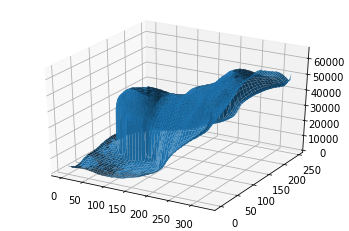

In [141]:
import numpy
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import cv2


%matplotlib inline



# Set up grid and test data
nx, ny =  model3D.shape[0],  model3D.shape[1]
x = range(nx)
y = range(ny)


hf = plt.figure()
ha = hf.add_subplot(111, projection='3d')

X, Y = numpy.meshgrid(x, y)  # `plot_surface` expects `x` and `y` data to be 2D
ha.plot_surface(X, Y, numpy.transpose(model3D))

plt.show()

In [ ]:
# 

# Fichier `.ply`
## Librairie plyfile

In [22]:
!pip install plyfile

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from plyfile import PlyData, PlyElement
import numpy as np



def use_plyfile(pts, write_text):
    x, y, z = pts[:, 0], pts[:, 1], pts[:, 2]
    pts = list(zip(x, y, z))

    # the vertex are required to a 1-d list
    vertex = np.array(pts, dtype=[('x', 'f4'), ('y', 'f4'), ('z', 'f4')])

    el = PlyElement.describe(vertex, 'vertex')
    PlyData([el], text=write_text).write('my_pts3.ply')

# use python-plyfile
#pts = np.random.randint(0, 100, (100, 3))
vertices = np.zeros(a = numpy.zeros(shape=(n,n,n))
depths = depth_array

for x in range(depths.shape[0]):
    for y in range(depths.shape[1]):
        vertices.append([float(x), float(y), depths[x][y]])
write_text = True
print(type(vertices[1]))
use_plyfile(vertices, write_text)

TypeError: ignored

# O3D

In [11]:
!pip3 install open3d

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.5/422.5 MB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 91.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.3/75.3 KB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 94.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 72.8 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2
  Attempting uninstall: nbformat
    Found existing installation: nbformat 5.7.1
    Uninstalling nbformat-5.7.1:
      Successfully uninstalled nbformat-5.7.1


In [142]:
import open3d as o3d

In [143]:
# Pass numpy array to Open3D.o3d.geometry.PointCloud and visualize
#xyz = np.random.rand(100, 3)
#pcd = o3d.geometry.PointCloud()
#pcd.points = o3d.utility.Vector3dVector(xyz)
#o3d.io.write_point_cloud("data.ply", pcd)

In [144]:
vertices = []
depths = depth_array

for x in range(depths.shape[0]):
    for y in range(depths.shape[1]):
        vertices.append((float(x), float(y), depths[x][y]))

pcd = o3d.geometry.PointCloud()
point_cloud = np.asarray(np.array(vertices))
pcd.points = o3d.utility.Vector3dVector(point_cloud)
pcd.estimate_normals()
pcd = pcd.normalize_normals()

pcd.colors = o3d.utility.Vector3dVector(tuple(map(tuple, colors_pixels)))


#o3d.io.write_point_cloud("data.ply", pcd)
#o3d.visualization.draw_geometries([pcd])

## Sous-Echantillonage du modèle

In [135]:
import math
import itertools
# Create bounding box:
bounds = [[-math.inf, math.inf], [-math.inf, math.inf], [1, 2]]  # set the bounds
bounding_box_points = list(itertools.product(*bounds))  # create limit points
bounding_box = o3d.geometry.AxisAlignedBoundingBox.create_from_points(o3d.utility.Vector3dVector(bounding_box_points))  # create bounding box object

# Crop the point cloud using the bounding box:
pcd_croped = pcd.crop(bounding_box)

In [123]:
voxel_down_pcd = pcd.voxel_down_sample(voxel_size=0.05)

# Création des triangles

In [41]:
!pip install trimesh

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 670.9/670.9 KB 11.9 MB/s eta 0:00:00


In [145]:
import open3d as o3d
import trimesh
import numpy as np

pcd.estimate_normals()

# estimate radius for rolling ball
distances = pcd.compute_nearest_neighbor_distance()
avg_dist = np.mean(distances)
radius = 1.5 * avg_dist   

mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_ball_pivoting(
           pcd,
           o3d.utility.DoubleVector([radius, radius * 2]))

# create the triangular mesh with the vertices and faces from open3d
tri_mesh = trimesh.Trimesh(np.asarray(mesh.vertices), np.asarray(mesh.triangles),
                          vertex_normals=np.asarray(mesh.vertex_normals))

trimesh.convex.is_convex(tri_mesh)

False

In [146]:
triangles = np.asarray(mesh.triangles)
vertices = np.asarray(mesh.vertices)



In [147]:
colors = None
if mesh.has_triangle_normals():
    colors = (0.5, 0.5, 0.5) + np.asarray(mesh.triangle_normals) * 0.5
    colors = tuple(map(tuple, colors))
else:
    colors = (1.0, 0.0, 0.0)

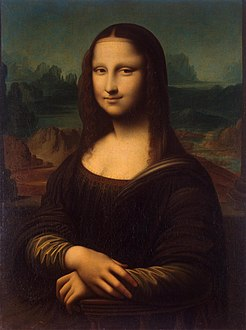

In [148]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import plotly.graph_objects as go
fig = go.Figure(
    data=[
        go.Mesh3d(
            x=vertices[:,0],
            y=vertices[:,1],
            z=vertices[:,2],
            i=triangles[:,0],
            j=triangles[:,1],
            k=triangles[:,2],
            facecolor=colors,
            opacity=0.50)
    ],
    layout=dict(
        scene=dict(
            xaxis=dict(visible=False),
            yaxis=dict(visible=False),
            zaxis=dict(visible=False)
        )
    )
)
fig.show()
img

In [151]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import plotly.graph_objects as go

pcd_display = pcd

points = np.asarray(pcd_display.points)
colors = np.asarray(pcd_display.colors)
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=points[:,0], y=points[:,1], z=points[:,2], 
            mode='markers',
            marker=dict(size=1, color = "black")
        )
    ],
    layout=dict(
        scene=dict(
            xaxis=dict(visible=False),
            yaxis=dict(visible=False),
            zaxis=dict(visible=False)
        )
    )
)

import plotly.io as pio
pio.renderers.default = 'colab'
fig.show()

### Test affichage

In [12]:
!wget https://graphics.stanford.edu/~mdfisher/Data/Meshes/bunny.obj

--2023-01-25 09:54:46--  https://graphics.stanford.edu/~mdfisher/Data/Meshes/bunny.obj
Resolving graphics.stanford.edu (graphics.stanford.edu)... 171.67.77.70
Connecting to graphics.stanford.edu (graphics.stanford.edu)|171.67.77.70|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 205917 (201K) [text/plain]
Saving to: ‘bunny.obj.1’

bunny.obj.1         100%[===================>] 201.09K   404KB/s    in 0.5s    

2023-01-25 09:54:47 (404 KB/s) - ‘bunny.obj.1’ saved [205917/205917]



In [16]:
mesh = o3d.io.read_triangle_mesh("bunny.obj")
if mesh.is_empty(): exit()

In [17]:
if not mesh.has_vertex_normals(): mesh.compute_vertex_normals()
if not mesh.has_triangle_normals(): mesh.compute_triangle_normals()

In [25]:
triangles = np.asarray(mesh.triangles)
vertices = np.asarray(mesh.vertices)
colors = None
if mesh.has_triangle_normals():
    colors = (0.5, 0.5, 0.5) + np.asarray(mesh.triangle_normals) * 0.5
    print(colors.size)
    colors = tuple(map(tuple, colors))
else:
    colors = (1.0, 0.0, 0.0)


14904


In [65]:
fig = go.Figure(
    data=[
        go.Mesh3d(
            x=vertices[:,0],
            y=vertices[:,1],
            z=vertices[:,2],
            i=triangles[:,0],
            j=triangles[:,1],
            k=triangles[:,2],
            facecolor=colors,
            opacity=0.50)
    ],
    layout=dict(
        scene=dict(
            xaxis=dict(visible=False),
            yaxis=dict(visible=False),
            zaxis=dict(visible=False)
        )
    )
)
fig.show()